Лабораторная работа № 2

Выполнил: **Цыганов Никита, М-20-ИВТ 3**
Задание: 
## 1 Часть
Изучение сети и набора данных.
Выполнить анализ статьи, разобрать структуру сети, принести распечатанную статью,
подготовить презентацию по структуре сети и набору данных, написать код по загрузке 
набора данных в Google Colab и визуализации части изображений из набора данных
Подготовка презентации по описанию сети допустимо в группах. Обратите внимание
что для разбора даны архитекутры, которые достаточно известны и следовательно имеют
описание на русском языке. Способ загрузки: сделайте zip архив, загрузите его в google drive,
разархивируйте архив (!unzip -uq "/content/drive/My Drive/PATH_TO_ZIP" -d "/content/drive/My Drive/PATH_TO_OUTPUT"
), используйте генератор для передачи данных в нейронную сеть (для этого
можно использовать сеть с любой архитекутрой, даже самой простой, цель - проверить загрузку данных).


## 2 часть
Программная реализация структуры сети. 
По результатам выполнения первой части задания определить структурный элемент сети. Построить несколько вариантов сетей
с разным числом структурных элементов. Для загрузки данных использовать генератор. Зашумить изображения для теста (нормальный, равномерный шум, ОСШ - 5, 20 дБ), оценить точность. 
Сравнить полученные результаты с известными результатами по точности. Визуализировать карту признаков и ядра свёртки для разных слоёв одного вариантов из обученных сетей.
Все результаты экспериментов должны быть сохранены, должна быть выбрана архитекутра сети, обеспечивающая наилучшую точность распознавания, показаны результаты экспериментов по разным архитектурам. 
По результатам должна быть оформлена презентация.


# Что такое VGG16?

## **VGG16** — модель сверточной нейронной сети, предложенная K. Simonyan и A. Zisserman из Оксфордского университета в статье “Very Deep Convolutional Networks for Large-Scale Image Recognition”. Модель достигает точности 92.7% — топ-5, при тестировании на ImageNet в задаче распознавания объектов на изображении. Этот датасет состоит из более чем 14 миллионов изображений, принадлежащих к 1000 классам.

## **VGG16** — одна из самых знаменитых моделей, отправленных на соревнование ILSVRC-2014. Она является улучшенной версией AlexNet, в которой заменены большие фильтры (размера 11 и 5 в первом и втором сверточном слое, соответственно) на несколько фильтров размера 3х3, следующих один за другим. Сеть VGG16 обучалась на протяжении нескольких недель при использовании видеокарт NVIDIA TITAN BLACK.



## Архитектура VGG16 представлена на рисунке ниже.

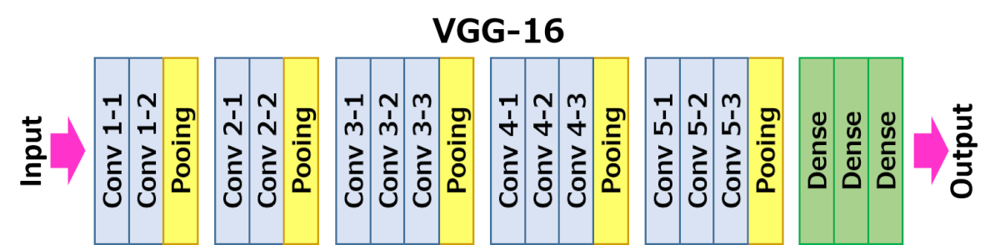

## На вход слоя conv1 подаются RGB изображения. Далее изображения проходят через стек сверточных слоев, в которых используются фильтры с очень маленьким рецептивным полем размера 3х3 (который является наименьшим размером для получения представления о том,где находится право/лево, верх/низ, центр).

## В одной из конфигураций используется сверточный фильтр размера 1х1, который может быть представлен как линейная трансформация входных каналов (с последующей нелинейностью). Сверточный шаг фиксируется на значении 1 пиксель. Пространственное дополнение (padding) входа сверточного слоя выбирается таким образом, чтобы пространственное разрешение сохранялось после свертки, то есть дополнение равно 1 для 3х3 сверточных слоев. Пространственный пулинг осуществляется при помощи пяти **max-pooling*** слоев, которые следуют за одним из сверточных слоев (не все сверточные слои имеют последующие max-pooling). Операция max-pooling выполняется на окне размера 2х2 пикселей с шагом 2.
## ***Операция подвыборки (pooling, max-pooling)** - простыми словами, операция подвыборки это процесс сжатия (уменьшения размеров) изображения путём сложения значений блоков пикселей. Давайте рассмотрим как это работает на конкретном примере.

## После стека сверточных слоев (который имеет разную глубину в разных архитектурах) идут три полносвязных слоя: первые два имеют по 4096 каналов, третий — 1000 каналов (так как в соревновании ILSVRC требуется классифицировать объекты по 1000 категориям; следовательно, классу соответствует один канал). Последним идет soft-max слой. Конфигурация полносвязных слоев одна и та же во всех нейросетях.

## Все скрытые слои снабжены **ReLU****.
##  ****Rectified Linear Unit** — это наиболее часто используемая функция активации при глубоком обучении. Данная функция возвращает 0, если принимает отрицательный аргумент, в случае же положительного аргумента, функция возвращает само число. То есть она может быть записана как f(z)=max(0,z). На первый взгляд может показаться, что она линейна и имеет те же проблемы что и линейная функция, но это не так и ее можно использовать в нейронных сетях с множеством слоев. Функция ReLU обладает несколькими преимущества перед сигмоидой и гиперболическим тангенсом:

## Очень быстро и просто считается производная. Для отрицательных значений — 0, для положительных — 1.
## Разреженность активации. В сетях с очень большим количеством нейронов использование сигмоидной функции или гиперболического тангенса в качестве активационный функции влечет активацию почти всех нейронов, что может сказаться на производительности обучения модели. Если же использовать ReLU, то количество включаемых нейронов станет меньше, в силу характеристик функции, и сама сеть станет легче.
## У данной функции есть один недостаток, называющийся проблемой умирающего ReLU. Так как часть производной функции равна нулю, то и градиент для нее будет нулевым, а то это значит, что веса не будут изменяться во время спуска и нейронная сеть перестанет обучаться.

## Функцию активации ReLU следует использовать, если нет особых требований для выходного значения нейрона, вроде неограниченной области определения. Но если после обучения модели результаты получились не оптимальные, то стоит перейти к другим функциям, которые могут дать лучший результат.
## Также можно отметить, что сети (за исключением одной) не содержат слоя нормализации (Local Response Normalisation), так как нормализация не улучшает результата на датасете ILSVRC, а ведет к увеличению потребления памяти и времени исполнения кода.

## **Недостатки:**
## К сожалению, сеть VGG имеет два серьезных недостатка:

* ## Очень медленная скорость обучения.
* ## Сама архитектура сети весит слишком много (появляются проблемы с диском и пропускной способностью)

## Из-за глубины и количества полносвязных узлов, VGG16 весит более 533 МБ. Это делает процесс развертывания VGG утомительной задачей. Хотя VGG16 и используется для решения многих проблем классификации при помощи нейронных сетей, меньшие архитектуры более предпочтительны (SqueezeNet, GoogLeNet и другие). Несмотря на недостатки, данная архитектура является отличным строительным блоком для обучения, так как её легко реализовать.

# Пример:

In [ ]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
import numpy as np
import matplotlib.pyplot as plt
import zipfile
import random
from shutil import copyfile

In [ ]:
!wget --no-check-certificate \
    "https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip" \
    -O "/tmp/cats-and-dogs.zip"

local_zip = '/tmp/cats-and-dogs.zip'
zip_ref   = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

--2021-12-07 17:33:13--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip
Resolving download.microsoft.com (download.microsoft.com)... 92.123.124.137, 2a02:26f0:11e:4bc::e59, 2a02:26f0:11e:4b5::e59
Connecting to download.microsoft.com (download.microsoft.com)|92.123.124.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824894548 (787M) [application/octet-stream]
Saving to: ‘/tmp/cats-and-dogs.zip’

/tmp/cats-and-dogs. 100%[===================>] 786.68M   119MB/s    in 6.6s    

2021-12-07 17:33:21 (120 MB/s) - ‘/tmp/cats-and-dogs.zip’ saved [824894548/824894548]



In [ ]:
try:
    os.mkdir('/tmp/cats-v-dogs')
    os.mkdir('/tmp/cats-v-dogs/training')
    os.mkdir('/tmp/cats-v-dogs/testing')
    os.mkdir('/tmp/cats-v-dogs/training/cats')
    os.mkdir('/tmp/cats-v-dogs/training/dogs')
    os.mkdir('/tmp/cats-v-dogs/testing/cats')
    os.mkdir('/tmp/cats-v-dogs/testing/dogs')
except OSError:
    pass

In [ ]:
def split_data(SOURCE, TRAINING, TESTING, SPLIT_SIZE):
    files = []
    for filename in os.listdir(SOURCE):
        file = SOURCE + filename
        if os.path.getsize(file) > 0:
            files.append(filename)
        else:
            print(filename + " is zero length, so ignoring.")

    training_length = int(len(files) * SPLIT_SIZE)
    testing_length = int(len(files) - training_length)
    shuffled_set = random.sample(files, len(files))
    training_set = shuffled_set[0:training_length]
    testing_set = shuffled_set[-testing_length:]

    for filename in training_set:
        this_file = SOURCE + filename
        destination = TRAINING + filename
        copyfile(this_file, destination)

    for filename in testing_set:
        this_file = SOURCE + filename
        destination = TESTING + filename
        copyfile(this_file, destination)


CAT_SOURCE_DIR = "/tmp/PetImages/Cat/"
TRAINING_CATS_DIR = "/tmp/cats-v-dogs/training/cats/"
TESTING_CATS_DIR = "/tmp/cats-v-dogs/testing/cats/"
DOG_SOURCE_DIR = "/tmp/PetImages/Dog/"
TRAINING_DOGS_DIR = "/tmp/cats-v-dogs/training/dogs/"
TESTING_DOGS_DIR = "/tmp/cats-v-dogs/testing/dogs/"

split_size = .9
split_data(CAT_SOURCE_DIR, TRAINING_CATS_DIR, TESTING_CATS_DIR, split_size)
split_data(DOG_SOURCE_DIR, TRAINING_DOGS_DIR, TESTING_DOGS_DIR, split_size)

666.jpg is zero length, so ignoring.
11702.jpg is zero length, so ignoring.


In [ ]:
print(len(os.listdir('/tmp/cats-v-dogs/training/cats/')))
print(len(os.listdir('/tmp/cats-v-dogs/training/dogs/')))
print(len(os.listdir('/tmp/cats-v-dogs/testing/cats/')))
print(len(os.listdir('/tmp/cats-v-dogs/testing/dogs/')))

11250
11250
1250
1250


In [ ]:
# baseline model for the dogs vs cats dataset
import sys
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Flatten
from tensorflow.keras.optimizers import SGD
from keras.preprocessing.image import ImageDataGenerator
 
# define one-block VGG model
def define_model_one_vgg():
	model = Sequential()
	model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(150, 150, 3)))
	model.add(MaxPooling2D((2, 2)))
	model.add(Flatten())
	model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = SGD(learning_rate=0.001, momentum=0.9)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model


# define two-block VGG model
def define_model_two_vgg():
	model = Sequential()
	model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(150, 150, 3)))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Flatten())
	model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = SGD(learning_rate=0.001, momentum=0.9)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model


# define three-block VGG model
def define_model_three_vgg():
	model = Sequential()
	model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(150, 150, 3)))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Flatten())
	model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = SGD(learning_rate=0.001, momentum=0.9)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model
 
# plot diagnostic learning curves
def summarize_diagnostics(history, name):
	# plot loss
	val_loss = history.history['val_loss']
	pyplot.subplot(211)
	pyplot.title('Cross Entropy Loss')
	pyplot.plot(history.history['loss'], color='blue', label='train')
	pyplot.plot(val_loss, color='orange', label='test')
	# plot accuracy
	pyplot.subplot(212)
	pyplot.title('Classification Accuracy')
	pyplot.plot(history.history['accuracy'], color='blue', label='train')
	pyplot.plot(history.history['val_accuracy'], color='orange', label='test')
	# save plot to file
	pyplot.savefig(name + '_plot.png')
	pyplot.close()
 
# run the test harness for evaluating a model
def run_test_harness(model, name):
	# create data generator
	datagen = ImageDataGenerator(rescale=1.0/255.0)
	# prepare iterators
	train_it = datagen.flow_from_directory('/tmp/cats-v-dogs/training/',
		class_mode='binary', batch_size=2, target_size=(150, 150))
	test_it = datagen.flow_from_directory('/tmp/cats-v-dogs/testing/',
		class_mode='binary', batch_size=2, target_size=(150, 150))
	# fit model
	base_learning_rate = 0.0001
	model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])
 # evaluate model
	_, acc = model.evaluate(test_it, steps=len(test_it), verbose=0)
 
	history = model.fit(train_it, epochs=5, steps_per_epoch=len(train_it), validation_data=test_it)
	print('> %.3f' % (acc * 100.0))
	# learning curves
	summarize_diagnostics(history, name)
 

# define models
# model_one = define_model_one_vgg()
# model_two = define_model_two_vgg()
# model_three = define_model_three_vgg()

# !unzip -o my_model_one.zip
# !unzip -o my_model_two.zip
# !unzip -o my_model_three.zip
# !unzip -o my_model_vgg16.zip

# model_one = tf.keras.models.load_model("my_model_one/")
# model_two = tf.keras.models.load_model("my_model_two/")
# model_three = tf.keras.models.load_model("my_model_three/")
# model_vgg16 = tf.keras.models.load_model("my_model_vgg16/")

# entry point, run the test harness:

Archive:  my_model_vgg16.zip
   creating: my_model_vgg16/
  inflating: my_model_vgg16/keras_metadata.pb  
   creating: my_model_vgg16/variables/
  inflating: my_model_vgg16/variables/variables.index  
  inflating: my_model_vgg16/variables/variables.data-00000-of-00001  
  inflating: my_model_vgg16/saved_model.pb  
   creating: my_model_vgg16/assets/


In [ ]:
# run_test_harness(model_one, "model_one")

Found 22498 images belonging to 2 classes.
Found 2500 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1096: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


Epoch 1/5
 5925/11249 [==============>...............] - ETA: 2:13 - loss: 0.7981 - accuracy: 0.6409

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 32 bytes but only got 0. Skipping tag 270
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 5 bytes but only got 0. Skipping tag 271
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 272
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 282
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only

11249/11249 [==============================] - 295s 26ms/step - loss: 0.7109 - accuracy: 0.6636 - val_loss: 0.5759 - val_accuracy: 0.7176
Epoch 2/5
11249/11249 [==============================] - 293s 26ms/step - loss: 0.5493 - accuracy: 0.7450 - val_loss: 0.5643 - val_accuracy: 0.7204
Epoch 3/5
11249/11249 [==============================] - 293s 26ms/step - loss: 0.4985 - accuracy: 0.7798 - val_loss: 0.5904 - val_accuracy: 0.7284
Epoch 4/5
11249/11249 [==============================] - 292s 26ms/step - loss: 0.4444 - accuracy: 0.8079 - val_loss: 0.7084 - val_accuracy: 0.7080
Epoch 5/5
11249/11249 [==============================] - 293s 26ms/step - loss: 0.4003 - accuracy: 0.8302 - val_loss: 0.6224 - val_accuracy: 0.7396
> 51.880


## График модели:
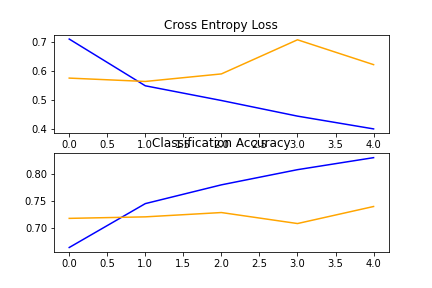

In [ ]:
# run_test_harness(model_two, "model_two")

Found 22498 images belonging to 2 classes.
Found 2500 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1096: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


Epoch 1/5
 6227/11249 [===============>..............] - ETA: 1:25 - loss: 0.6205 - accuracy: 0.6849

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 32 bytes but only got 0. Skipping tag 270
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 5 bytes but only got 0. Skipping tag 271
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 272
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 282
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only

11249/11249 [==============================] - 202s 18ms/step - loss: 0.5915 - accuracy: 0.7126 - val_loss: 0.5647 - val_accuracy: 0.7360
Epoch 2/5
11249/11249 [==============================] - 202s 18ms/step - loss: 0.5130 - accuracy: 0.7770 - val_loss: 0.5607 - val_accuracy: 0.7572
Epoch 3/5
11249/11249 [==============================] - 204s 18ms/step - loss: 0.4848 - accuracy: 0.7943 - val_loss: 0.6061 - val_accuracy: 0.7360
Epoch 4/5
11249/11249 [==============================] - 203s 18ms/step - loss: 0.4583 - accuracy: 0.8124 - val_loss: 0.5332 - val_accuracy: 0.7860
Epoch 5/5
11249/11249 [==============================] - 198s 18ms/step - loss: 0.4387 - accuracy: 0.8225 - val_loss: 0.5394 - val_accuracy: 0.7936
> 50.000


## График модели:
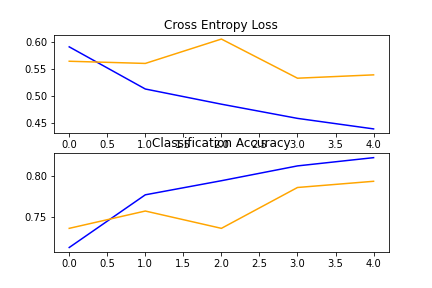

In [ ]:
# run_test_harness(model_three, "model_three")

Found 22498 images belonging to 2 classes.
Found 2500 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1096: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


Epoch 1/5
 4936/11249 [============>.................] - ETA: 1:35 - loss: 0.6144 - accuracy: 0.6799

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 32 bytes but only got 0. Skipping tag 270
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 5 bytes but only got 0. Skipping tag 271
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 272
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 282
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only

11249/11249 [==============================] - 181s 16ms/step - loss: 0.5829 - accuracy: 0.7153 - val_loss: 0.6323 - val_accuracy: 0.7128
Epoch 2/5
11249/11249 [==============================] - 182s 16ms/step - loss: 0.5241 - accuracy: 0.7681 - val_loss: 0.5109 - val_accuracy: 0.7812
Epoch 3/5
11249/11249 [==============================] - 181s 16ms/step - loss: 0.4823 - accuracy: 0.7938 - val_loss: 0.6231 - val_accuracy: 0.7220
Epoch 4/5
11249/11249 [==============================] - 181s 16ms/step - loss: 0.4639 - accuracy: 0.8046 - val_loss: 0.5410 - val_accuracy: 0.7968
Epoch 5/5
11249/11249 [==============================] - 188s 17ms/step - loss: 0.4500 - accuracy: 0.8151 - val_loss: 0.4405 - val_accuracy: 0.8192
> 50.520


## График модели:
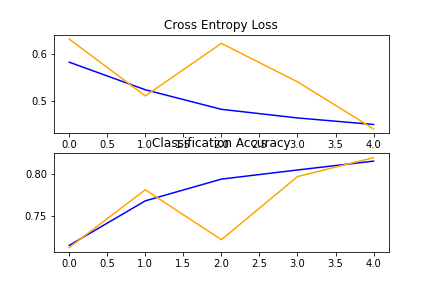

In [ ]:
import sys
from matplotlib import pyplot
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.layers import Dense
from keras.layers import Flatten
from keras.preprocessing.image import ImageDataGenerator

# define VGG16 model
def define_model_VGG16():
	# load model
	tmp_model = VGG16(include_top=False, input_shape=(150, 150, 3))
	# mark loaded layers as not trainable
	for layer in tmp_model.layers:
		layer.trainable = False
	# add new classifier layers
	flat1 = Flatten()(tmp_model.layers[-1].output)
	class1 = Dense(128, activation='relu', kernel_initializer='he_uniform')(flat1)
	output = Dense(1, activation='sigmoid')(class1)
	# define new model
	tmp_model = Model(inputs=tmp_model.inputs, outputs=output)
	# compile model
	opt = tf.keras.optimizers.SGD(lr=0.001, momentum=0.9)
	tmp_model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return tmp_model

model_vgg16 = define_model_VGG16()
run_test_harness(model_vgg16, "model_vgg16")

58900480/58889256 [==============================] - 1s 0us/step


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


Found 22498 images belonging to 2 classes.
Found 2500 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1096: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


Epoch 1/5
 2529/11249 [=====>........................] - ETA: 5:03 - loss: 0.3261 - accuracy: 0.8634

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 32 bytes but only got 0. Skipping tag 270
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 5 bytes but only got 0. Skipping tag 271
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 272
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 282
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only

11249/11249 [==============================] - 428s 38ms/step - loss: 0.2991 - accuracy: 0.8863 - val_loss: 0.2394 - val_accuracy: 0.9100
Epoch 2/5
11249/11249 [==============================] - 427s 38ms/step - loss: 0.2595 - accuracy: 0.9103 - val_loss: 0.3008 - val_accuracy: 0.8952
Epoch 3/5
11249/11249 [==============================] - 429s 38ms/step - loss: 0.2412 - accuracy: 0.9200 - val_loss: 0.3830 - val_accuracy: 0.8824
Epoch 4/5
11249/11249 [==============================] - 433s 38ms/step - loss: 0.2306 - accuracy: 0.9217 - val_loss: 0.3042 - val_accuracy: 0.9124
Epoch 5/5
11249/11249 [==============================] - 433s 39ms/step - loss: 0.2248 - accuracy: 0.9266 - val_loss: 0.2910 - val_accuracy: 0.9112
> 48.360


## График модели:
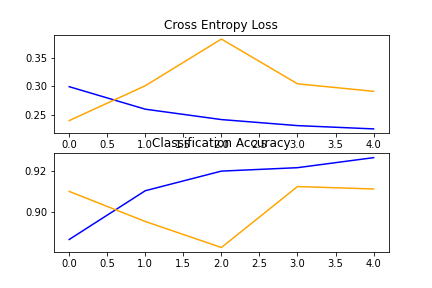

Saving sdfdf.jpg to sdfdf (18).jpg
sdfdf.jpg is a cat


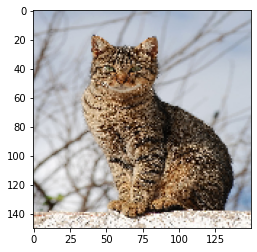

In [ ]:
import numpy as np
from google.colab import files
from keras.preprocessing import image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(150, 150))
  x = data = asarray(img)
  _x = np.expand_dims(x, axis=0)

  images = np.vstack([_x])
  classes = model_vgg16.predict(images, batch_size=10)
  # print(classes[0])
  plt.imshow(img)
  if classes[0]>0.5:
    print(fn + " is a dog")
  else:
    print(fn + " is a cat")

In [ ]:
pip install acoustics

     |████████████████████████████████| 851 kB 5.2 MB/s 
  Created wheel for acoustics: filename=acoustics-0.2.4.post0-py3-none-any.whl size=68748 sha256=ed427d5776a936ef85c14d7c473bd8fd60ac49ada3753369960e551a45eaa745
  Stored in directory: /root/.cache/pip/wheels/f3/5a/4f/c9918830ce8d8c280f82e74117c99eab4a45225d5ff60c2674
Successfully built acoustics


In [ ]:
import skimage
import acoustics

def white_noise(image): # равномерный шум
  return skimage.util.random_noise(image, mode='gaussian', seed=None, clip=True)

def gasuss_noise(image): # нормальный шум

    '''
        Добавить гауссовский шум
                 Среднее значение: среднее
                 Вар: Разнообразие
    '''
    
    image = np.array(image/255, dtype=float)
    noise = np.random.normal(size=image.shape)
    out = image + noise
    if out.min() < 0:
        low_clip = -1.
    else:
        low_clip = 0.
    out = np.clip(out, low_clip, 1.0)
    out = np.uint8(out*255)

    return out
  
def add_noise(signal, snr): # ОСШ
    ''' 
    signal: np.ndarray
    snr: float

    returns -> np.ndarray
    '''

    # Generate the noise as you did
    noise = acoustics.generator.white(signal.size).reshape(*signal.shape)
    # For the record I think np.random.random does exactly the same thing

    # work out the current SNR
    current_snr = np.mean(signal) / np.std(noise)

    # scale the noise by the snr ratios (smaller noise <=> larger snr)
    noise *= (current_snr / snr)

    # return the new signal with noise
    return signal + noise

Saving sdfdf.jpg to sdfdf (17).jpg
[0.00052104]
sdfdf.jpg is a cat


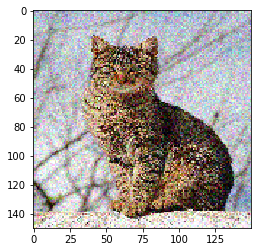

In [ ]:
# Белый шум:
import numpy as np
from google.colab import files
from keras.preprocessing import image
from numpy import asarray

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(150, 150))
  # x = image.img_to_array(img)
  x = data = asarray(img)
  
  x = white_noise(x)
  plt.imshow(x, interpolation='nearest')
  _x = np.expand_dims(x, axis=0)

  images = np.vstack([_x])
  classes = model_vgg16.predict(images, batch_size=10)
  print(classes[0])

  if classes[0]>0.5:
    print(fn + " is a dog")
  else:
    print(fn + " is a cat")

Saving sdfdf.jpg to sdfdf (23).jpg
[1.]
sdfdf.jpg is a dog


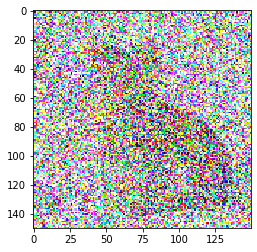

In [ ]:
# нормальный шум:

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(150, 150))
  x = data = asarray(img)
  x = gasuss_noise(x)
  _x = np.expand_dims(x, axis=0)

  images = np.vstack([_x])
  classes = model_vgg16.predict(images, batch_size=10)
  print(classes[0])
  plt.imshow(x, interpolation='nearest')
  if classes[0]>0.5:
    print(fn + " is a dog")
  else:
    print(fn + " is a cat")

Saving sdfdf.jpg to sdfdf (25).jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0.]
sdfdf.jpg is a cat


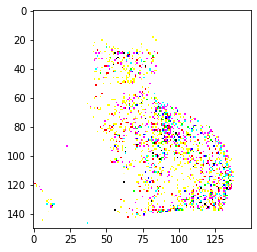

In [ ]:
# ОСШ 5дб:
uploaded = files.upload()

for fn in uploaded.keys():
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(150, 150))
  x = data = asarray(img)
  x = add_noise(x, 5.0)
  plt.imshow(x, interpolation='nearest')
  _x = np.expand_dims(x, axis=0)

  images = np.vstack([_x])
  classes = model_vgg16.predict(images, batch_size=10)
  print(classes[0])
 
  if classes[0]>0.5:
    print(fn + " is a dog")
  else:
    print(fn + " is a cat")

Saving sdfdf.jpg to sdfdf (26).jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0.]
sdfdf.jpg is a cat


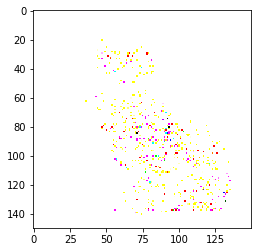

In [ ]:
# ОСШ 20дб:
import numpy as np
from google.colab import files
from keras.preprocessing import image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(150, 150))
  x = data = asarray(img)
  x = add_noise(x, 20.0)
  plt.imshow(x, interpolation='nearest')
  _x = np.expand_dims(x, axis=0)

  images = np.vstack([_x])
  classes = model_vgg16.predict(images, batch_size=10)
  print(classes[0])
  if classes[0]>0.5:
    print(fn + " is a dog")
  else:
    print(fn + " is a cat")

In [ ]:
print(len(model_vgg16.layers))

22


In [ ]:
# Визуализация карты признаков и ядра свёртки для разных слоёв одного вариантов из обученных сетей на основе стандартной VGG16

import cv2
import numpy as np
import torch
from torch.autograd import Variable
from torchvision import models
import os

# Эта функция создает каталог файлов для сохранения карты объектов и присваивает папке имя с номером сетевого слоя, например, feature \\ 1 \\ .. Папка сохраняет выходную карту объектов второго слоя
def mkdir(path):

    isExists = os.path.exists(path) # Определить, существует ли путь, если он существует, вернуть True, если не существует, вернуть False
    if not isExists: # Создайте каталог, если он не существует
        os.makedirs(path)
        return True
    else:
        return False

# Функция предварительной обработки изображения, преобразовать изображение в размер [224,224], выполнить нормализацию и вернуть четырехмерный тензор [1,3,224,224]
def preprocess_image(cv2im, resize_im=True):

    # Среднее и стандартное отклонение изображения, рассчитанное на ImageNet 1 миллион изображений, сделает значение пикселя изображения между [-2,7, 2,1], но общее распределение значений пикселей изображения будет стандартным нормальным распределением (среднее значение равно 0, дисперсия 1)
    # Причина использования этого метода заключается в том, что он основан на предварительных требованиях ImageNet VGG16 к входному изображению.
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    # Измените размер изображения и выполните Нормализацию
    if resize_im:
        cv2im = cv2.resize(cv2im, dsize=(224, 224),interpolation=cv2.INTER_CUBIC)
    im_as_arr = np.float32(cv2im)
    im_as_arr = np.ascontiguousarray(im_as_arr[..., ::-1])
    im_as_arr = im_as_arr.transpose(2, 0, 1)  # Измените порядок [W, H, C] на [C, W, H]

    for channel, _ in enumerate(im_as_arr): # Выполните нормализацию входного изображения ImageNet, требуемого VGG16, предварительно обученного в ImageNet
        im_as_arr[channel] /= 255
        im_as_arr[channel] -= mean[channel]
        im_as_arr[channel] /= std[channel]

    # Преобразовать в трехмерный тензор, [C, W, H]
    im_as_ten = torch.from_numpy(im_as_arr).float()
    im_as_ten = im_as_ten.unsqueeze_(0) # Расширить до четырехмерного тензора, стать [1, C, W, H]

    return im_as_ten # Вернуть обработанный [1,3,224,224] четырехмерный тензор


class FeatureVisualization():

    def __init__(self,img_path,selected_layer):
        '''
                 : param img_path: путь к входному изображению
                 : param selected_layer: порядковый номер визуализируемого сетевого уровня
        '''
        self.img_path = img_path
        self.selected_layer = selected_layer
        self.pretrained_model = models.vgg16(pretrained=True).features # Вызываем предварительно обученную модель vgg16

    def process_image(self):
        img = cv2.imread(self.img_path)
        img = preprocess_image(img)
        return img

    def get_feature(self):

        input=self.process_image() # Прочитать входное изображение
        # Ниже приведен ключевой код: в соответствии с заданным номером слоя вернуть вывод слоя
        x = input
        for index, layer in enumerate(self.pretrained_model):
            x = layer(x) # Дайте входные данные каждому слою модели. Обратите внимание, что выходные данные первого слоя должны использоваться как входные данные второго слоя, поэтому они будут использоваться повторно x

            if (index == self.selected_layer): # Если номер индекса каждого слоя модели равен выбранному номеру слоя, который, как ожидается, будет визуализирован
                return x # Возвращаем выходную четырехмерную карту объектов текущего слоя модели

    def get_single_feature(self):
        features = self.get_feature() # Получить выходную четырехмерную карту объектов ожидаемого слоя модели
        return features

    def save_feature_to_img(self):

        features=self.get_single_feature() # Возвращает вывод карты объектов по указанному слою, который принадлежит четырехмерному тензору [пакет, канал, ширина, высота]
        for i in range(features.shape[1]):
            feature = features[:, i, :, :] # В измерении канала каждый канал представляет собой карту характеристик вывода ядра свертки, поэтому изображение каждого канала обрабатывается и сохраняется отдельно
            feature = feature.view(feature.shape[1], feature.shape[2]) # партия равна 1, поэтому ее можно напрямую рассматривать как двумерный тензор
            feature = feature.data.numpy() # Преобразовать в numpy

            # Согласно максимальному и минимальному значениям изображения, значение пикселя карты признаков нормализуется до [0,1];
            feature = (feature - np.amin(feature))/(np.amax(feature) - np.amin(feature) + 1e-5) # Обратите внимание, чтобы знаменатель не был равен 0! 
            feature = np.round(feature * 255) # [0, 1] —— [0, 255], для функции cv2.imwrite ()

            mkdir('fea/' + str(self.selected_layer))  # Создайте папку для сохранения, названную по серийному номеру выбранного слоя визуализации
            cv2.imwrite('fea/' + str(self.selected_layer) + '/' + str(i) + '.jpg',feature)  # Сохранение карты функций на каждом канале, выходящем из текущего слоя, как изображение


if __name__=='__main__':
    !mkdir 'fea'
    !cd 'fea'
    for k in range(len(model_vgg16.layers)): # k представляет собой порядковый номер выбранного слоя визуализации.
        myClass = FeatureVisualization('sdfdf.jpg', k) # Создать экземпляр класса
        print (myClass.pretrained_model)
        myClass.save_feature_to_img() # Запустить визуализацию и сохранить карту объектов как изображение


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

## 1 слой:
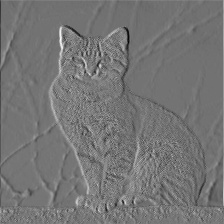

## 2 слой:
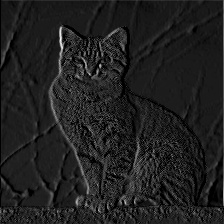

## 5 слой:
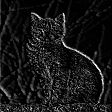

## 10 слой:
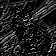

##15 слой:
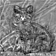

## 22 слой:
image.png

In [ ]:
from keras.preprocessing import image

img = image.load_img('cat.jpg', target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255
img_tensor -= img_tensor.mean()
img_tensor /= img_tensor.std()
img_tensor.shape

(1, 150, 150, 3)

In [ ]:
layer_outputs = [layer.output for layer in model_vgg16.layers[1:19]]
activation_model = models.Model(inputs=model_vgg16.input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)
print(len(activations))
print(activations[0].shape)
print(activations[1].shape)
print(activations[2].shape)

18
(1, 150, 150, 64)
(1, 150, 150, 64)
(1, 75, 75, 64)


In [ ]:
layer_names = []
for layer in model_vgg16.layers[1:19]:
  layer_names.append(layer.name)
layer_names

['block1_conv1',
 'block1_conv2',
 'block1_pool',
 'block2_conv1',
 'block2_conv2',
 'block2_pool',
 'block3_conv1',
 'block3_conv2',
 'block3_conv3',
 'block3_pool',
 'block4_conv1',
 'block4_conv2',
 'block4_conv3',
 'block4_pool',
 'block5_conv1',
 'block5_conv2',
 'block5_conv3',
 'block5_pool']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


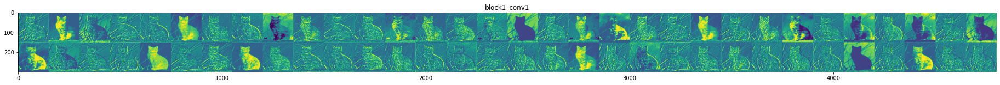

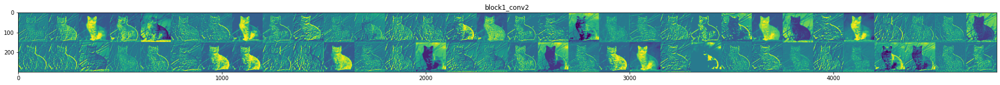

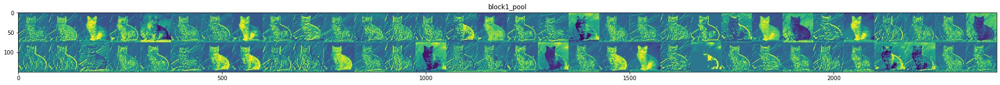

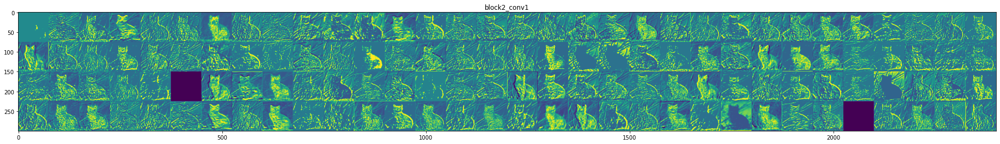

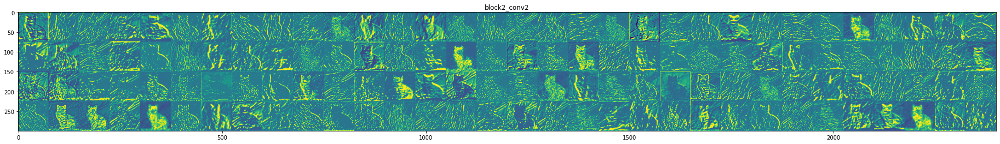

...

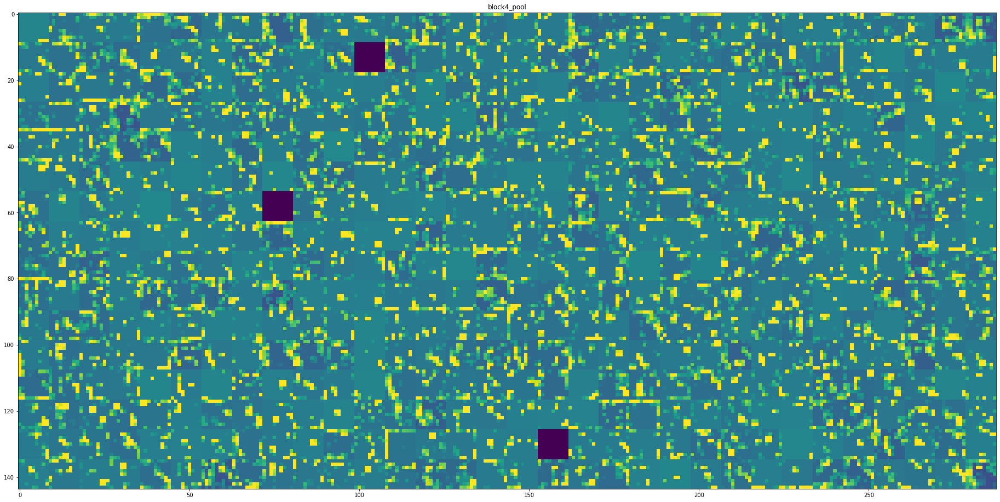

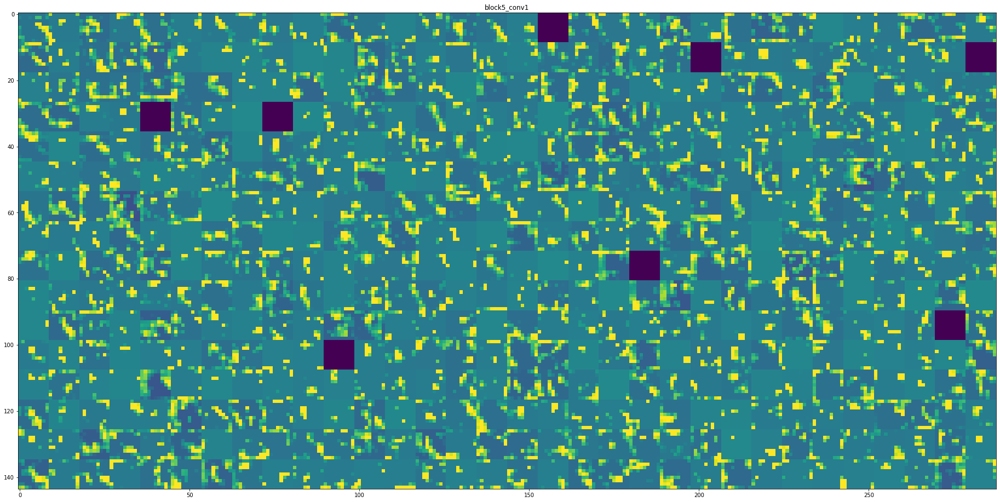

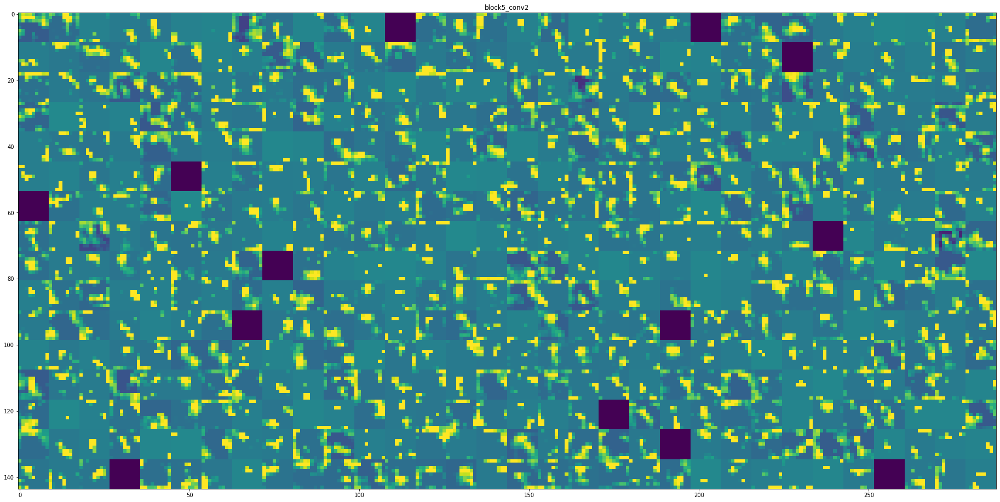

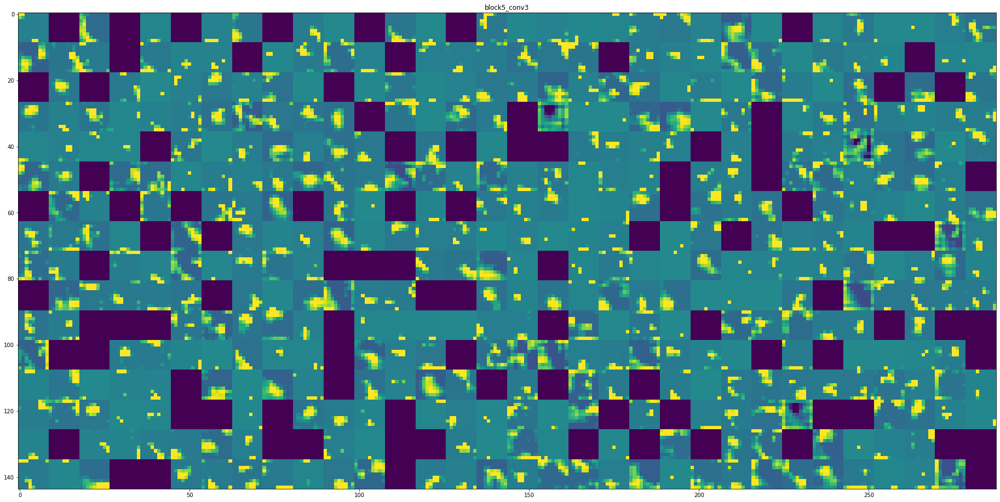

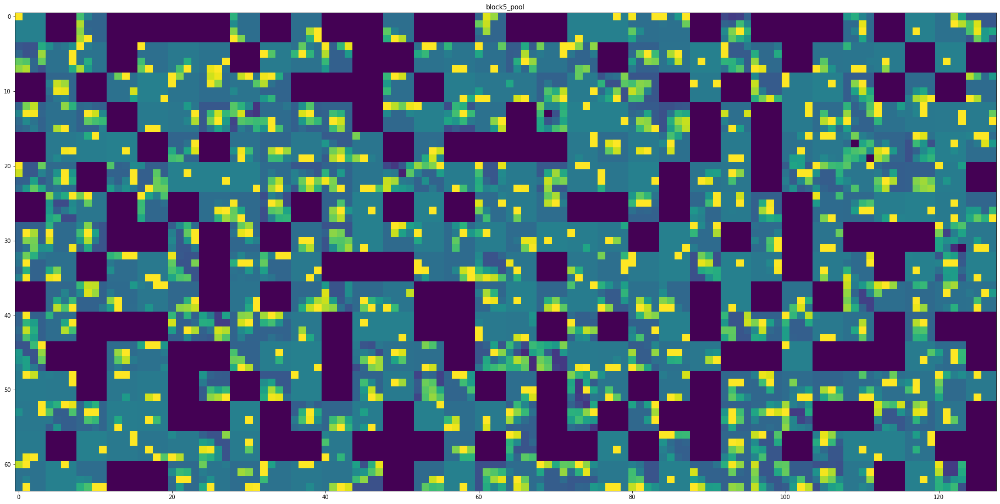

In [ ]:
from tensorflow.keras import models

image_per_row = 32

for layer_name, layer_activation in zip(layer_names, activations):
  n_features = layer_activation.shape[-1]
  size = layer_activation.shape[1]
  n_rows = n_features // image_per_row
  display_grid = np.zeros((size * n_rows, size * image_per_row))

  for row in range((n_rows)):
    for col in range((image_per_row)):
      channel_image = layer_activation[0, :, :, row * image_per_row + col]
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[row * size : (row + 1) * size,
                   col * size : (col + 1) * size] = channel_image

  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [ ]:
model_one.save("my_model_one")
model_two.save("my_model_two")
model_three.save("my_model_three")
model_vgg16.save("my_model_vgg16")

INFO:tensorflow:Assets written to: my_model_one/assets
INFO:tensorflow:Assets written to: my_model_two/assets
INFO:tensorflow:Assets written to: my_model_three/assets
INFO:tensorflow:Assets written to: my_model_vgg16/assets


In [ ]:
!zip -r my_model_one.zip my_model_one/
!zip -r my_model_two.zip my_model_two/
!zip -r my_model_three.zip my_model_three/
!zip -r my_model_vgg16.zip my_model_vgg16/

  adding: my_model_one/ (stored 0%)
  adding: my_model_one/keras_metadata.pb (deflated 88%)
  adding: my_model_one/variables/ (stored 0%)
  adding: my_model_one/variables/variables.index (deflated 61%)
  adding: my_model_one/variables/variables.data-00000-of-00001 (deflated 45%)
  adding: my_model_one/saved_model.pb (deflated 87%)
  adding: my_model_one/assets/ (stored 0%)
  adding: my_model_two/ (stored 0%)
  adding: my_model_two/keras_metadata.pb (deflated 90%)
  adding: my_model_two/variables/ (stored 0%)
  adding: my_model_two/variables/variables.index (deflated 63%)
  adding: my_model_two/variables/variables.data-00000-of-00001 (deflated 33%)
  adding: my_model_two/saved_model.pb (deflated 89%)
  adding: my_model_two/assets/ (stored 0%)
  adding: my_model_three/ (stored 0%)
  adding: my_model_three/keras_metadata.pb (deflated 91%)
  adding: my_model_three/variables/ (stored 0%)
  adding: my_model_three/variables/variables.index (deflated 65%)
  adding: my_model_three/variables/var